In [ ]:
# Mount your Drive, as usual
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install gdown
import gdown

!pip install moviepy
from moviepy.editor import VideoFileClip

!pip install librosa
import librosa
from moviepy.editor import AudioFileClip

import matplotlib.pyplot as plt
import librosa
import numpy as np

import IPython.display as ipd

In [ ]:
# Let us download a sample song from Google Drive
# I downloaded the song by converting a Youtube clip to a .wav file (a typical audio format)

# The shared link to the
url = 'https://drive.google.com/uc?id=1JfmytsOwjweKCzR2IXGln3wmxq0FSTvx'
# Output filename (specify it as you please)
output = 'my_video.mp4'
gdown.download(url, output, quiet=False)

In [4]:
# We can now load the video
# We will only load a few seconds to save time (otherwise the loading takes forever)
# We are using the subclip function for this
# Let us choose a part somewhere in the middle of the song
video = VideoFileClip(output).subclip(105, 125)

# Display the clipped video, if you want (uncomment the following)
# video.ipython_display()

In [5]:
# Next, since we are focusing on audio analysis today, we are going to keep only the audio of the video

# Extract audio from the video clip
audio = video.audio
# Temporary file to save audio
audio_file = "temp_audio.wav"
audio.write_audiofile(audio_file)

# Load the audio file with librosa
# Librosa is the pandas of audio data (that is, a mainstream package)
y, sr = librosa.load(audio_file, sr=None)  # `sr=None` to preserve original sampling rate

# Now y is the audio waveform and sr is the sampling rate.

MoviePy - Writing audio in temp_audio.wav


MoviePy - Done.


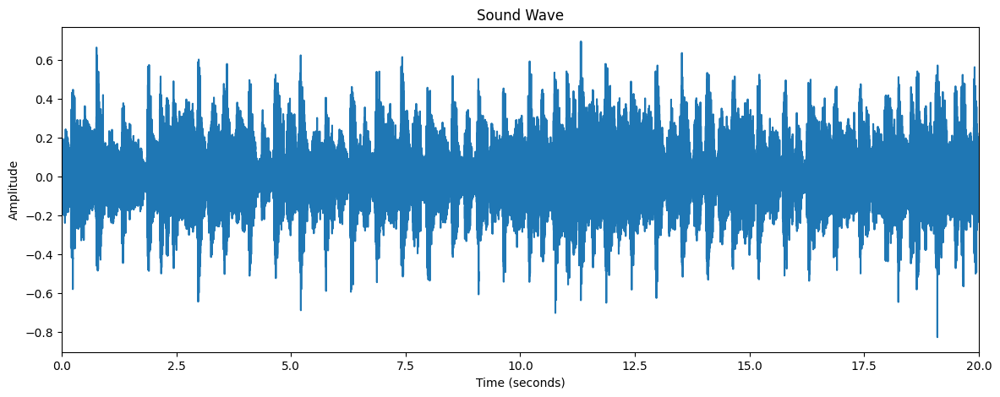

In [6]:
# For a better intuition, we can plot the sound wave
# Calculate the time axis by creating an array that represents each sample's timestamp
time = np.linspace(0, len(y) / sr, num=len(y))

# Plot the sound wave against time
plt.figure(figsize=(14, 5))
plt.plot(time, y)
plt.title('Sound Wave')
plt.ylabel('Amplitude')
plt.xlabel('Time (seconds)')
plt.xlim(0, len(y) / sr)  # Limit x-axis to the length of the audio file in seconds
plt.show()


Why does it not look like a "real" or "nice" wave?

In contrast to a pure tone with a more regular and sinusoidal waveform, real-world audio recordings like songs are complex combinations of waves at various frequencies, amplitudes, and phases. (Phases refer to the question whether two waves are "synchronized" or not.)

This complex combination produces a waveform that noisy.

In [7]:
# In case you have not displayed the video above, here you can listed to the song snippet
ipd.display(ipd.Audio(data=y, rate=sr))

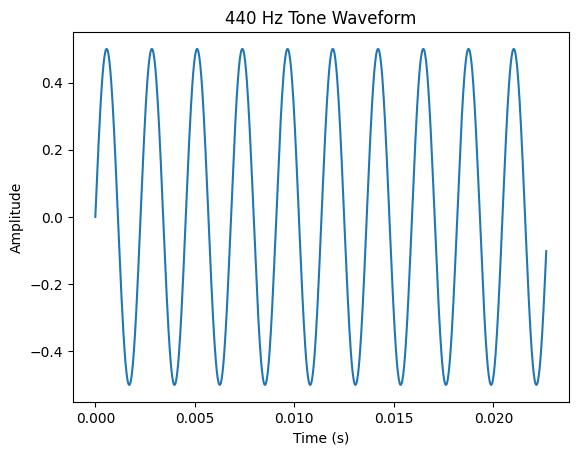

In [8]:
# For a comparison, let us synthetically generate a cleaner audio signal
# Specifically, let us create the tone A (at 440 Hz)
# For the musicians among you, it is an A4

freq_simple = 440  # Our note A frequency in Hz
sr_simple = 44100  # Sampling rate in Hz
duration = 1  # Duration in seconds

# Generate the time points
t = np.linspace(0, duration, int(sr_simple * duration), endpoint=False)

# Generate the audio signal...
y_simple = 0.5 * np.sin(2 * np.pi * freq_simple * t)  # 0.5 to keep the amplitude in the range [-0.5, 0.5]

# Why 2 * np.pi, you may wonder?
# This is a constant that converts the freq_simple from Hertz into radians per second, the unit expected by the np.sin function

# ...and plot the wave
plt.plot(t[0:1000], y_simple[0:1000])  # We only plot the 1000 samples
plt.title('440 Hz Tone Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()


In [9]:
# How does it sound?
ipd.display(ipd.Audio(data=y_simple, rate=sr_simple))

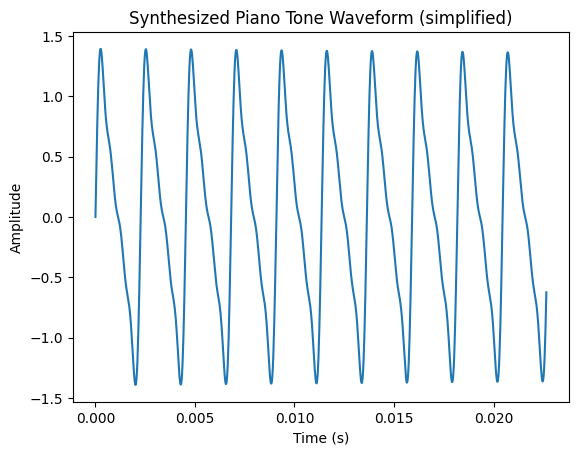

In [10]:
# What do you think, how would the wave change if we had a piano play this tone?
# Let us synthesize a piano-like sound

import numpy as np
import matplotlib.pyplot as plt

# Base parameters
freq_piano = 440  # The base frequency in Hz (A4 note)
sr_piano = 44100  # Sample rate in Hz
duration = 1  # Duration of the note in seconds

# Generate time points
t_piano = np.linspace(0, duration, int(sr_piano * duration), endpoint=False)

# Start with a base sine wave (the fundamental frequency)
y_piano = np.sin(2 * np.pi * freq_piano * t)

# Add some harmonics with lower amplitudes
harmonics_frequencies = [2 * freq_piano, 3 * freq_piano, 4 * freq_piano]  # Example: second, third and fourth harmonics
harmonics_amplitudes = [0.5, 0.25, 0.125]  # Each harmonic has less amplitude than the previous one

for i, (hf, ha) in enumerate(zip(harmonics_frequencies, harmonics_amplitudes)):
    y_piano += ha * np.sin(2 * np.pi * hf * t)

# Envelope shaping - this is a simple linear decay, real piano ADSR would be more complex
envelope = np.linspace(1, 0, int(sr_piano * duration))
y_piano *= envelope

# Plot the waveform
plt.plot(t_piano[:1000], y_piano[:1000])  # Only plot the first 1000 samples to see the waveform clearly
plt.title('Synthesized Piano Tone Waveform (simplified)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()


In [11]:
# Let us play this wave
ipd.display(ipd.Audio(data=y_piano, rate=sr_piano))

In [12]:
# Next, to get some intuition for the sample rate, we can downsample it
# Let's say we want to decrease the sample rate to 8 kHz
new_sr = 8000

# Use librosa's resample function to decrease the sample rate
y_low_res = librosa.resample(y, orig_sr=sr, target_sr=new_sr)

# Play the original audio
print("Original audio:")
ipd.display(ipd.Audio(data=y, rate=sr))

# Play the downsampled audio
print("Downsampled audio to 8 kHz:")
ipd.display(ipd.Audio(data=y_low_res, rate=new_sr))

# What happens when you set the new sampling rate to even lower values, like 2000 or 1000? Why?

Original audio:


Downsampled audio to 8 kHz:


When you resample audio to a very low sample rate like 1000 Hz (1 kHz), you're reducing the number of samples per second to a level that might not be sufficient to represent the audio signal in a way that's recognizable or even playable. The Nyquist-Shannon sampling theorem states that to accurately capture a signal, the sampling rate must be at least twice the highest frequency present in the signal.

Most of the sounds that comprise speech or music have frequencies well above 1 kHz. By resampling to 1 kHz, we essentially lose most of the audio content above 500 Hz (which is 1 kHz / 2). Then, the audio file can be severely distorted or even just a series of clicks and noise, which may not be recognized as valid audio by some players.

Also, certain audio players might have lower limits on the sample rates they can handle. A sample rate of 1 kHz might be too low for some systems to reproduce, resulting in no sound being played back.

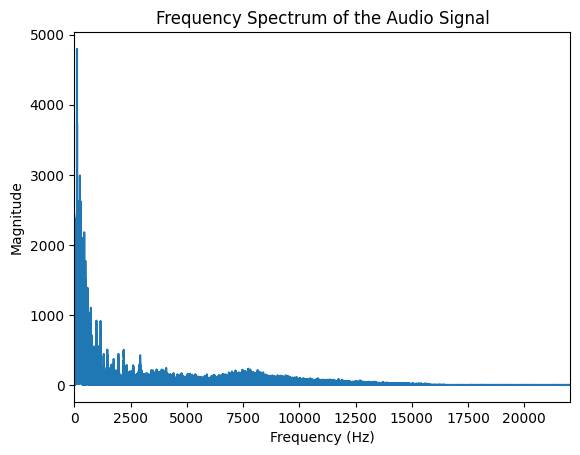

Highest significant frequency: 12810.01452382599 Hz


In [13]:
# Let us check what is the highest frequency in the sample

# Perform a discrete Fourier transform using Fast Fourier Transform (FFT)
# (We will hear more about Fourier transform later)
fft_output = np.fft.fft(y)

# Get the magnitude
magn_song = np.abs(fft_output)

# Create a frequency vector that corresponds to the magnitude vector
freq_song = np.linspace(0, sr, len(magn_song))

# Because the FFT output is symmetric, we only need the first half of it
half_length = len(magn_song)//2
magn_song = magn_song[:half_length]
freq_song = freq_song[:half_length]

# Define a threshold to consider a frequency component significant
# Let us take a percentage of the max magnitude
threshold = max(magn_song) * 0.01  # For example, 1% of the max magnitude
# You can experiment with this threshold to see how the highest frequency value changes

# Find the indices where the magnitude is above the threshold
significant_indices = np.where(magn_song > threshold)[0]

# The highest frequency is the last one in the array of significant frequencies
highest_frequency = freq_song[significant_indices[-1]] if significant_indices.size > 0 else 0

# Plot the spectrum
plt.plot(freq_song, magn_song)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Frequency Spectrum of the Audio Signal')
plt.xlim(0, sr / 2)  # limit x-axis up to Nyquist frequency
plt.show()

# Print the peak and the highest significant frequency
print(f"Highest significant frequency: {highest_frequency} Hz")


To explain the above: To determine the highest frequency present in a signal, you can perform a Fourier Transform on your audio data, which converts the time-domain signal into the frequency domain. The most common algorithm for this purpose is the Fast Fourier Transform (FFT). By examining the magnitude of the resulting frequency spectrum, you can see which frequencies are present in your signal and their relative intensities.

In [18]:
# Now, what happens if we keep the y values as-is, but play them with the "wrong" sample rate?
# Let us see what happens if we double or half the sample rate: what would you expect to happen? Why?
# Hint: if you have been thinking, so far, that this song cannot get any worse, be ready for a surprise 😉

# Play the original audio
print("Original audio:")
ipd.display(ipd.Audio(data=y, rate=sr))

# Play the audio with double the sample rate
print("Double the sample rate:")
ipd.display(ipd.Audio(data=y, rate=sr*2))

# Play the audio with half the sample rate
print("Halve the sample rate:")
ipd.display(ipd.Audio(data=y, rate=sr/2))

Original audio:


Double the sample rate:


Halve the sample rate:


In [15]:
# This experiment points to an important realization: both the speed and the pitch are related to the sample rate (intuitively, you might think it is just the speed)

In [16]:
# Some thoughts to conclude this tutorial:
# We saw that we can represent the audio snippet using waveform values (y) and the sample rate!
# This is the equivalent of being able to present an entire image just with pixel values...

# What do you think? Could we theoretically use lower sample rates to accurately capture lower sounds?
# And why is the standard sample rate of 44.1 kHz convenient?